# T03 - Restauración

Alfredo Nicolas Pizarro Pérez

20807063-0

# A) Proceso simulado (movimiento horizontal no uniforme)

A-1) Primero cargo la imagen original (F) de M columnas:

In [1]:
import numpy as np
import matplotlib.pylab as plt
from cv2 import imread

In [2]:
!wget https://www.dropbox.com/scl/fi/5s3dmisv0jd3cld6w59qz/hoja.png?rlkey=fesjj4ekidulyrufwwfelusk2

--2025-11-08 13:14:55--  https://www.dropbox.com/scl/fi/5s3dmisv0jd3cld6w59qz/hoja.png?rlkey=fesjj4ekidulyrufwwfelusk2
Resolving www.dropbox.com (www.dropbox.com)... 162.125.85.18, 2620:100:6035:18::a27d:5512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.85.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://ucf81b7da2bca24c3eef62ef9d66.dl.dropboxusercontent.com/cd/0/inline/C0xcT5iOJ3g6DYL-Qef_fLVwME-sUsJfUMuMsHuA6wPUB48Wrs-fkP2qI_vuApeWKPneg9FtmNv6J0DTRdYPsPltxKbL5EO4h1cPw_0oS40BvgxkfPZga_7RGL0jUQikxqE/file# [following]
--2025-11-08 13:14:56--  https://ucf81b7da2bca24c3eef62ef9d66.dl.dropboxusercontent.com/cd/0/inline/C0xcT5iOJ3g6DYL-Qef_fLVwME-sUsJfUMuMsHuA6wPUB48Wrs-fkP2qI_vuApeWKPneg9FtmNv6J0DTRdYPsPltxKbL5EO4h1cPw_0oS40BvgxkfPZga_7RGL0jUQikxqE/file
Resolving ucf81b7da2bca24c3eef62ef9d66.dl.dropboxusercontent.com (ucf81b7da2bca24c3eef62ef9d66.dl.dropboxusercontent.com)... 162.125.85.15, 2620:100:6035:15::a27d:550f
Connecting to ucf81b

Text(0.5, 1.0, 'Imagen Original')

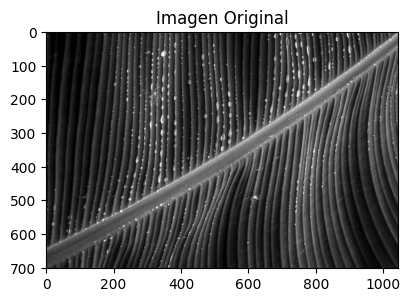

In [3]:
imag  = imread('hoja.png?rlkey=fesjj4ekidulyrufwwfelusk2')
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(imag, cmap='gray')
plt.title("Imagen Original")

A-2) Simular la imagen degaradada (G) de N columnas, a partir de la imagen F y la máscara h. Usar una función de este tipo:

 G = FuncionDegradacionA(F,h) = FH,

 donde H es una matriz de M x N, y h es la función de degradación del movimiento hoorizontal definida más arriba. Para esta simulación use `n=11`.

In [4]:
# primero definimos la mascara h con n=11
# n= 2q - 1
# q= (n-1)/2 = 6
# h = [ 1, 2, 3,...q-1, q, q-1,...,3,2, 1 ]/a,

h = np.array([1,2,3,4,5,6,5,4,3,2,1], dtype=float)
h = h / np.sum(h) # normalización para que la sumatoria de los terminos de h sea 1 como piden
n = h.size

Ahora defino la funcion de degradacion horizontal.

In [5]:
def FuncionDegradacionA(F, h):
    filas, cols = F.shape
    n = h.size
    cols_out = cols - n + 1   # columnas después de la degradación

    G = np.zeros((filas, cols_out))

    # Convolución horizontal explícita
    for i in range(filas):
        for j in range(cols_out):
            G[i, j] = np.sum(F[i, j:j+n] * h)

    return G

Aplico la degradacion de F con la mascara h para obtener la imagen degradada G y la visualizo.

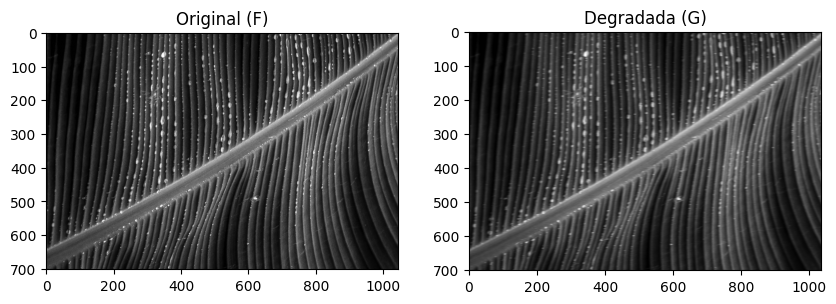

In [7]:
# Convertir a escala de grises
F = imag.copy()

if F.ndim == 3:
    F = F.mean(axis=2)

F = F.astype(float)

# Aplico la degradacion de F
G = FuncionDegradacionA(F , h)

# GRafico
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(F, cmap='gray')
plt.title("Original (F)")

plt.subplot(1,2,2)
plt.imshow(G, cmap='gray')
plt.title("Degradada (G)")

plt.show()

A-3) Usando el método de regularización visto en clase, encontar analíticamente la matriz A para este movimiento horizontal, tal que

 F* = GA',

 donde F* es la imagen resturada, y A' es la transpuesta de A. En esta solución, utilice una matriz de regularización W general. La respuesta aquí es una ecuación.

El modelo de degradación fila a fila es:
$$
\mathbf g = \mathbf H \mathbf f,
$$

El criterio de regularización visto en clases es:
$$
V(\mathbf f) = \lambda \, \|\mathbf H \mathbf f - \mathbf g\|^2 + \|\mathbf W \mathbf f\|^2,
$$
donde $\lambda > 0$ es el parámetro de regularización y $\mathbf W$ es una matriz reguladora general.

Derivando respecto de $\mathbf f$ y haciendo cero:
$$
(\lambda \mathbf H^{\sf T}\mathbf H + \mathbf W^{\sf T}\mathbf W)\,\hat{\mathbf f}
=
\lambda \mathbf H^{\sf T}\mathbf g.
$$

Por lo tanto, la solución restaurada es:
$$
\boxed{
\hat{\mathbf f}
=
\lambda \left( \lambda \mathbf H^{\sf T}\mathbf H + \mathbf W^{\sf T}\mathbf W \right)^{-1}\mathbf H^{\sf T}\mathbf g
}
$$

Si restauramos por filas para formar la imagen completa:
$$
F^* = G A',
$$
donde la matriz $A'$ es:
$$
\boxed{
A' = \lambda\, \mathbf H \left(\lambda\,\mathbf H^{\sf T}\mathbf H + \mathbf W^{\sf T}\mathbf W\right)^{-1}
}
$$

y por lo tanto:
$$
\boxed{
A = \lambda\left(\lambda\,\mathbf H^{\sf T}\mathbf H + \mathbf W^{\sf T}\mathbf W\right)^{-1}\mathbf H^{\sf T}
}
$$


Considerando $\mathbf W = \mathbf I$ y $\lambda = 10^{6}$, tenemos:

$$
A = \lambda\left(\lambda\,\mathbf H^{\sf T}\mathbf H + \mathbf I\right)^{-1}\mathbf H^{\sf T}
$$
Sustituyendo el valor de $\lambda$ explícitamente:

$$
A = 10^{6}\left(10^{6}\,\mathbf H^{\sf T}\mathbf H + \mathbf I\right)^{-1}\mathbf H^{\sf T}
$$

Donde con esto finalmente la imagen restaurada se puede obtener mediante:

$$
\mathbf F^{*} = \mathbf G\,A^{\sf T}
$$

A-4) Encuentre la imagen restaurada usando el criterio que minimiza la norma de cada fila restaurada. Calcule el error promedio, ERR (usar la definición vista en clases que entrega un número entre 0 y 100%).

Primero construyo H a partir de la mascara h (matriz NxM)

In [8]:
def construir_H(h, M):
    n = len(h)
    N = M - n + 1
    H = np.zeros((N, M))
    for i in range(N):
        H[i, i:i+n] = h
    return H

rows, M = F.shape
H = construir_H(h, M)

Ahora construyo A y hago la restauración usando el criterio mínimo con las formulas mencionadas en la pregunta anterior (con W = I, λ = 10^6)

In [9]:
lamda = 1e6
W = np.eye(M) #genera una matriz identidad de tamaño MxM

HT = H.T
Mmat = lamda * (HT @ H) + (W.T @ W)    # = (lamda H'H + I)
A = lamda * np.linalg.inv(Mmat) @ HT   # A = lamda (lamda H'H + I)^-1 H'

F_rest = G @ A.T   # Restauración completa (F* = G A')

La formula para calcular el el error promedio ERR vista en clase es:

$$
\mathrm{ERR} \;=\; \frac{1}{Q}\sum_{i}\sum_{j} \big|\,F(i,j) - \widehat{F}(i,j)\,\big|\;\times\; \frac{100}{255}
$$

In [10]:
def calcular_ERR(F_original, F_estimada, n):
    M = F_original.shape[1]
    N = M - n + 1
    # Recortar ambas imágenes a región común
    F_orig_crop = F_original[:, :N]
    F_est_crop = F_estimada[:, :N]
    Q = F_orig_crop.size
    ERR = (np.sum(np.abs(F_orig_crop - F_est_crop)) / Q) * (100/255)
    return ERR

ERR = calcular_ERR(F, F_rest, len(h))
print("ERR promedio = {:.4f}%".format(ERR))


ERR promedio = 0.9491%


Grafico las 3 imagenes que tenemos hasta ahora (Original, Degradada y Restaurada) para compararlas.

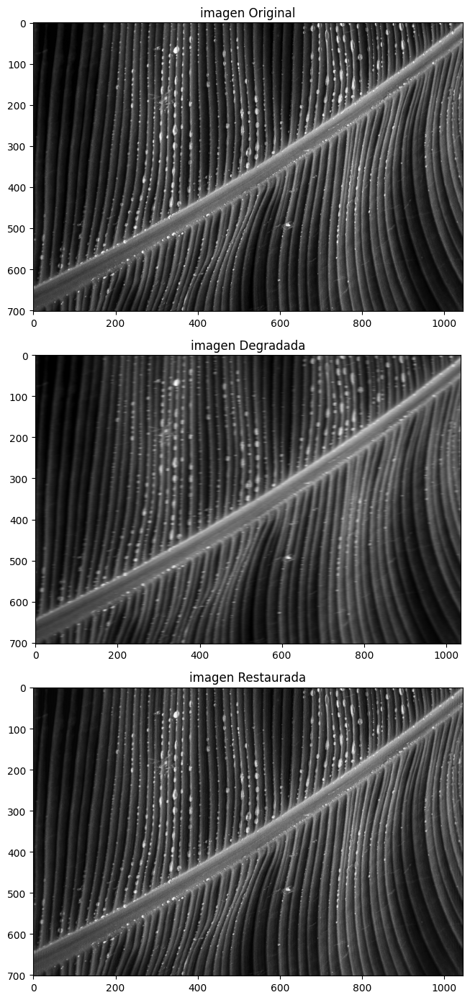

In [11]:
fig, ax = plt.subplots(3, 1, figsize=(18, 14))
ax[0].imshow(F, cmap='gray')
ax[0].set_title('imagen Original')
ax[0].axis('on')

ax[1].imshow(G, cmap='gray')
ax[1].set_title('imagen Degradada')
ax[1].axis('on')

ax[2].imshow(F_rest, cmap='gray')
ax[2].set_title('imagen Restaurada')
ax[2].axis('on')

plt.tight_layout()
plt.show()

Se recupera bastante bien la imagen original desde la degrada si comparamos las imagenes, ademas de que con el valor de ERR obtenido tambien se puede interpretar esto ya que es bastante bajo  (ERR promedio = 0.9491%).

A-5) Encuentre la imagen restaurada usando el criterio MINIO, es decir que la norma de la diferencia entre los primeros N elementos de cada columna restaurada y la columna degradada sea minima. Calcule el error promedio, ERR.

Usando la misma funcion vista en clase:

In [12]:
def res_minio(_img_g, h, method='minio'):
    if not isinstance(_img_g, np.ndarray):
        raise Exception('_img_g must be ndarray')
    if not isinstance(h, np.ndarray):
        raise Exception('h must be ndarray')
    if method not in ['minio', 'eye']:
        raise ValueError('method must be "minio" or "eye"')

    nh = h.shape[-1]
    n = _img_g.shape[-1]
    m = n + nh - 1  # ancho restaurado
    _mat_h = np.zeros((n, m))

    # Construcción de H (como en clase)
    for i in range(n):
        _mat_h[i, i:i + nh] = h.ravel()

    _lambda = 1e6  # Lagrange multiplier

    if method == 'minio':
        # matriz P = [I_N | 0]
        _mat_p = np.hstack([np.eye(n), np.zeros((n, nh - 1))])

        _img_f = _img_g @ (_lambda * _mat_h + _mat_p)
        _img_f = _img_f @ (np.linalg.inv((_lambda * _mat_h).T @ _mat_h + _mat_p.T @ _mat_p)).T

    if method == 'eye':  # otra versión
        _img_f = _img_g @ _mat_h
        _img_f = _img_f @ (np.linalg.inv((_lambda * _mat_h).T @ _mat_h + np.eye(m))).T

    # Clipping final
    _img_f[_img_f < 0] = 0
    _img_f[_img_f > 255] = 255

    return _img_f

In [13]:
#aplicando la restauracion minio a la imagen degradada G
F_minio = res_minio(G, h, method='minio')

El error promedio ERR es con la misma formula, entonces uso la misma funcion que antes defini.

In [14]:
ERR_minio = calcular_ERR(F, F_minio, len(h))
print("ERR (criterio MINIO) = {:.4f}%".format(ERR_minio))

ERR (criterio MINIO) = 0.9366%


Grafico las 3 imagenes que tenemos hasta ahora (Original, Degradada y Restaurada con metodo Minio) para compararlas.

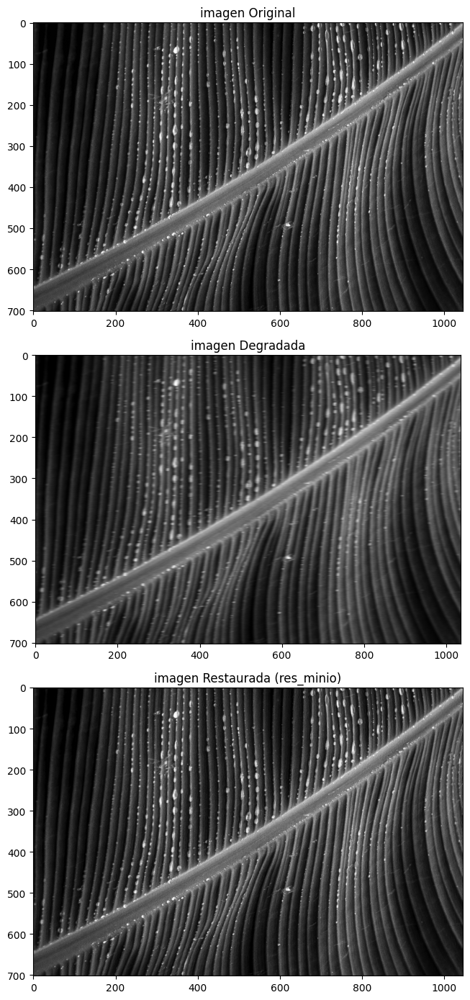

In [15]:
fig, ax = plt.subplots(3, 1, figsize=(18, 14))
ax[0].imshow(F, cmap='gray')
ax[0].set_title('imagen Original')
ax[0].axis('on')

ax[1].imshow(G, cmap='gray')
ax[1].set_title('imagen Degradada')
ax[1].axis('on')

ax[2].imshow(F_minio, cmap='gray')
ax[2].set_title('imagen Restaurada (res_minio)')
ax[2].axis('on')

plt.tight_layout()
plt.show()

En este caso tambien se recupera bastante bien la imagen original desde la degrada si comparamos las imagenes, ademas de que con el valor de ERR obtenido con este metodo tambien es bastante bajo (ERR (criterio MINIO) = 0.9366%).

A-6) Encuentre la imagen restaurada usando el criterio de minimizar las frecuencias altas de la columna restuarada. Para este caso utilice la transformada discreta de Fourier (DFT) y un filtro Gaussiano para escoger las frecuencias altas de la DFT. Calcule el error promedio, ERR.

Para este metodo buscamos definir una funcion D con las funciones bases de Fourier de tal forma que la DFT de f sea:

F_=Df

El filtro pasa alto se puede calcular como la multiplicacion de una matiz K (diagonal que tiene 1 en los extremos y 0 en el medio) por F_

Finalmente W sera:  W=KD

luego reemplazo en las ecuaciones que usamos anteriormente con W=KD, H y λ = 10^6 para obtener A y luego hacer F_rest = GA' para obtener la imagen restaurada.


In [16]:
# para trabajar con fourier necesito exportar sus funciones desde la libreria permitida numpy
from numpy.fft import fft, ifft, fftshift

In [50]:
# Tamaño de filas/columnas
M = G.shape[1]  # ancho de la imagen
N = G.shape[0]  # filas

Primero construyo la Matriz DFT unitaria D (M x M)

In [51]:
def DFT_matrix_unitary(M):
    n = np.arange(M)
    k = n.reshape((M,1))
    D = np.exp(-2j * np.pi * k @ n.reshape(1,-1)/M) / np.sqrt(M)
    return D

D = DFT_matrix_unitary(M)

Construir K: filtro gaussiano alto-paso en la diagonal

In [63]:
sigma_frac = 0.02  # controla ancho de la transición
freqs = np.fft.fftfreq(M)
fmag = np.abs(freqs)
lowpass = np.exp(-(fmag**2)/(2*sigma_frac**2))  # gaussiana
highpass = 1.0 - lowpass                        # pasa-alto
K = np.diag(highpass)
print(K)

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.00116396 0.         ... 0.         0.         0.        ]
 [0.         0.         0.00464771 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.01042699 0.         0.        ]
 [0.         0.         0.         ... 0.         0.00464771 0.        ]
 [0.         0.         0.         ... 0.         0.         0.00116396]]


Ahora que ya tengo K y D tengo que construir la matriz W con estas para minimizar frecuencias altas de f y aplicarla en el sistema de solucion para tener A y F* que habiamos visto en las ecuaciones de los ejercicios anteriores.

In [68]:
W = K @ D

# Sistema normal: (H^T H + lambda W^H W) A = H^T
lamda = 1e2      # valor moderado para este tipo de restauracion

H = construir_H(h, M)
HT = H.T                     # M x N
HtH = H.T @ H                 # M x M (real simétrica)
WtW = W.conj().T @ W        # M x M (Hermítica)


# Resolver para A: (H^T H + λ W^H W) A = H^T
A = lamda * np.linalg.solve(lamda*HtH + WtW, H.T)   # M x N


# Restaurar imagen:
F_rest_frec = G @ A.T

# Convertir a real y normalizar
F_rest_frec = np.real_if_close(F_rest_frec, tol=1e-8)
F_rest_frec -= F_rest_frec.min()
F_rest_frec = F_rest_frec / F_rest_frec.max() * 255
F_rest_frec = F_rest_frec.astype(np.uint8)

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 1026 is different from 1036)

Usamos la funcion antes definida para calcular el error ERR

In [65]:
ERR = calcular_ERR(F, F_rest_frec, len(h))
print("A-6 (criterio DFT Gaussiano HP): σ = {}, λ = {} → ERR = {:.6f} %".format(sigma_frac, lamda, ERR))

A-6 (criterio DFT Gaussiano HP): σ = 0.02, λ = 100.0 → ERR = 10.222319 %


Grafico las 3 imagenes que tenemos hasta ahora (Original, Degradada y Restaurada usando el criterio de minimizar las frecuencias altas de la columna restuarada) para compararlas.

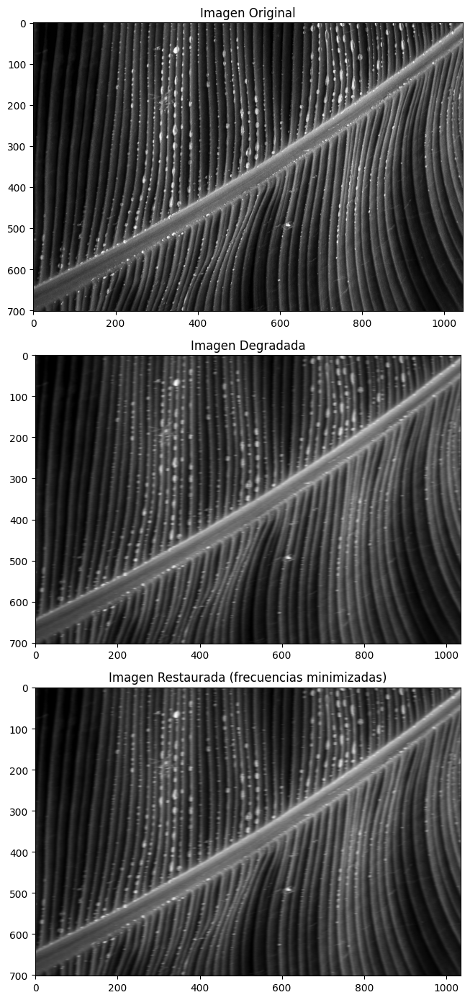

In [67]:
fig, ax = plt.subplots(3, 1, figsize=(18, 14))
ax[0].imshow(F, cmap='gray');     ax[0].set_title('Imagen Original');   ax[0].axis('on')
ax[1].imshow(G, cmap='gray');     ax[1].set_title('Imagen Degradada');  ax[1].axis('on')
ax[2].imshow(F_rest_frec, cmap='gray'); ax[2].set_title('Imagen Restaurada (frecuencias minimizadas)'); ax[2].axis('on')
plt.tight_layout()
plt.show()

probe con diferentes valores de lamda y sigma para el filtro pero no mejoro mucho la imagen restaurada con respecto a la degrada, esto se pudo deber a usar un H generico como la matriz identida, si uso el h que teniamos ante + el filtrado d frcuencia tenemos:

A-6 (criterio DFT Gaussiano HP): σ = 0.08, λ = 1000.0 → ERR = 3.997628 %


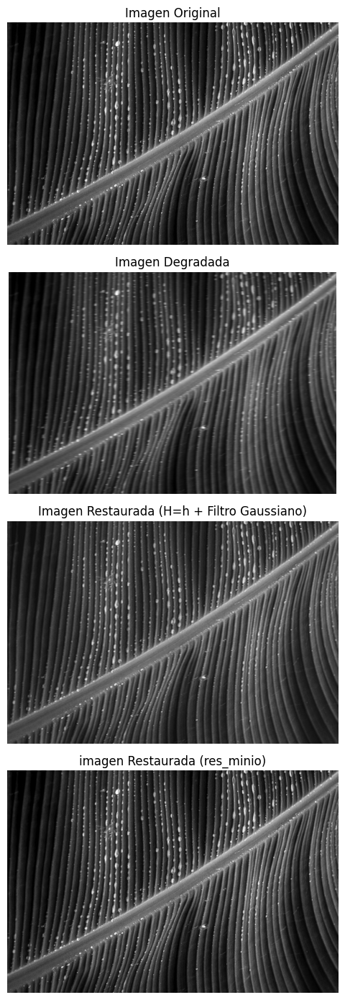

In [75]:
import numpy as np
import matplotlib.pyplot as plt

rows, M = F.shape
lamda = 1e3

h = np.array([1,2,3,4,5,6,5,4,3,2,1], dtype=float)
h = h / np.sum(h)
n = h.size

H = construir_H(h, M)

D = DFT_matrix_unitary(M)

# Filtro pasa-alto gaussiano
sigma_frac = 0.08
freqs = np.fft.fftfreq(M)
fmag = np.abs(freqs)
lowpass = np.exp(-(fmag**2)/(2*sigma_frac**2))
highpass = 1.0 - lowpass
K = np.diag(highpass)

# Matriz de regularización
W = K @ D

# Calcular A según la fórmula: A = λ (λ H^T H + W^T W)^(-1) H^T
HtH = H.T @ H
WtW = W.conj().T @ W
A = lamda * np.linalg.solve(lamda*HtH + WtW, H.T)

# Restaurar imagen fila por fila
F_rest_frec = G @ A.T

# Convertir a real y normalizar
F_rest_frec = np.real_if_close(F_rest_frec, tol=1e-8)
F_rest_frec -= F_rest_frec.min()
F_rest_frec = F_rest_frec / F_rest_frec.max() * 255
F_rest_frec = F_rest_frec.astype(np.uint8)

ERR = calcular_ERR(F, F_rest_frec, len(h))
print("A-6 (criterio DFT Gaussiano HP): σ = {}, λ = {} → ERR = {:.6f} %".format(sigma_frac, lamda, ERR))

# Visualización
fig, ax = plt.subplots(4,1,figsize=(18,14))
ax[0].imshow(F, cmap='gray');     ax[0].set_title('Imagen Original');   ax[0].axis('off')
ax[1].imshow(G, cmap='gray');     ax[1].set_title('Imagen Degradada');  ax[1].axis('off')
ax[2].imshow(F_rest_frec, cmap='gray'); ax[2].set_title('Imagen Restaurada (H=h + Filtro Gaussiano)'); ax[2].axis('off')
ax[3].imshow(F_minio, cmap='gray'); ax[3].set_title('imagen Restaurada (res_minio)'); ax[3].axis('off')  #grafique la imagen restaura del metodo anterior para comparar
plt.tight_layout()
plt.show()


Ahora si notamos que la recuperacion de la imagen es exitosa y notamos que la imagen recuperada con el metodo minio se ve más oscura y con los bordes y detalles más nítidos porque es un método mas agresivo que intenta invertir el desenfoque, mientras que la restauración H=h + filtro Gaussiano es más conservadora, suavizando las frecuencias altas para dar imagen legible mas suave con menos ruido, pero con bordes menos marcados.

# B) Proceso simulado (desenfoque con máscara Gaussiana)

B-1) Cargar la imagen original (F) de pixeles:

In [1]:
import numpy as np
import matplotlib.pylab as plt
from cv2 import imread, IMREAD_GRAYSCALE

In [2]:
!wget https://www.dropbox.com/scl/fi/by71296u79tc6i8f6643i/arbol.png?rlkey=6kk83ssra3dt4iycb9c46v2kr&e=1

--2025-11-08 14:41:25--  https://www.dropbox.com/scl/fi/by71296u79tc6i8f6643i/arbol.png?rlkey=6kk83ssra3dt4iycb9c46v2kr
Resolving www.dropbox.com (www.dropbox.com)... 162.125.80.18, 2620:100:6035:18::a27d:5512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.80.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc9d4b92d433844eacddbac0a57e.dl.dropboxusercontent.com/cd/0/inline/C0wOT4I8D2WPAXo9mMGM016gi5s3DBL4hh1grZ0519aYsccRR_HuhCOWrnvKjNfvybv26_vfREBBCQzhKJpz6TUXQiukZXd44V_myaBi_FFKEt7a94j0md26sAUrFbPkeWY/file# [following]
--2025-11-08 14:41:25--  https://uc9d4b92d433844eacddbac0a57e.dl.dropboxusercontent.com/cd/0/inline/C0wOT4I8D2WPAXo9mMGM016gi5s3DBL4hh1grZ0519aYsccRR_HuhCOWrnvKjNfvybv26_vfREBBCQzhKJpz6TUXQiukZXd44V_myaBi_FFKEt7a94j0md26sAUrFbPkeWY/file
Resolving uc9d4b92d433844eacddbac0a57e.dl.dropboxusercontent.com (uc9d4b92d433844eacddbac0a57e.dl.dropboxusercontent.com)... 162.125.85.15, 2620:100:6035:15::a27d:550f
Connecting to uc9d4

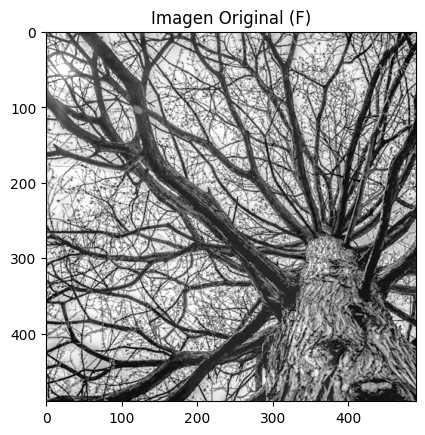

In [3]:
F  = imread('arbol.png?rlkey=6kk83ssra3dt4iycb9c46v2kr', IMREAD_GRAYSCALE).astype('double')
plt.imshow(F, cmap='gray')
plt.title('Imagen Original (F)')
plt.show()

B-2) Degrade la imagen con la máscara Gaussiana definida más arriba.

In [4]:
def gaussiankernel(size):
    """
    This method creates a symmetric Gaussian kernel.


    :param size: inf number to specify the size of the kernel.
            Typical numbers 3, 5, 9 ... etc.
    """


    sigma = size/8.5 #  width of the Gaussian distribution


    x, y = np.mgrid[-size // 2 + 1:size // 2 + 1,
           -size // 2 + 1:size // 2 + 1]


    kernel = np.exp(-((x ** 2 + y ** 2) / (2.0 * sigma ** 2)))
    kernel = kernel / kernel.sum()


    return kernel.astype('double')

Definimos la mascara gaussiana H

In [5]:
H = gaussiankernel(7)

Ahora convolucionamos la imagen original con la mascara gaussiana antes definida

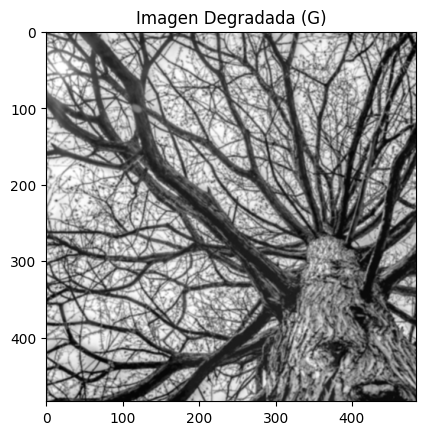

In [6]:
def conv2D(F, H):
    Fd = F.astype('double')
    N, M = F.shape
    n, m = H.shape
    G = np.zeros((N - n + 1, M - m + 1))
    p = int((n - 1) / 2)
    q = int((m - 1) / 2)
    for i in range(p, N - p):
        for j in range(q, M - q):
            S = np.multiply(Fd[i - p:i + p + 1, j - q:j + q + 1], H)
            G[i - p, j - q] = np.sum(S)
    return G

G = conv2D(F, H)
plt.imshow(G, cmap='gray')
plt.title('Imagen Degradada (G)')
plt.show()

B-3) Diseñe una función llamada restaura38 para restaurar porciones de 38x38 pixeles de la imagen degradada.

In [7]:
#necesito definir HH ya que permite que la convolución 2D se escriba como un producto de matrices, lo que facilita aplicar regularización y resolver ecuaciones lineales para restaurar la imagen.
def conv2Dmatrix(N,M,H):
    NF = N*M
    n,m = H.shape
    NG = (N-n+1)*(M-m+1)
    HH = np.zeros((NG,NF))
    p = int((n-1)/2)
    q = int((m-1)/2)
    t = 0
    ixF = np.zeros((N,M))
    for j in range(M):
        for i in range(N):
            ixF[i,j] = t
            t = t + 1
    t = 0
    for j in range(q,M-q):
        for i in range(p,N-p):
            for s in range(m):
                for r in range(n):
                    HH[t,int(ixF[i-p+r,j-q+s])] = H[r,s]
            t = t + 1
    return HH

#defino una funcion para usar la regularización vista en clases con parámetro λ para resolver (λ HHᵀHH + I)⁻¹ HHᵀ g y restaurar la imagen La imagen degradada
def restaura38(Gb,H):
    n, m = H.shape
    N1, M1 = Gb.shape           # tamaño de la imagen degradada
    N = N1 + n - 1              # tamaño extendido vertical
    M = M1 + m - 1              # tamaño extendido horizontal

    # Construir la matriz de convolución 2D HH
    HH = conv2Dmatrix(N, M, H)

    lam = 1e6                    # parámetro de regularización λ
    HHH = np.dot(HH.T, HH)       # H^T * H
    WWW = np.eye(HHH.shape[0], dtype='float')  # Matriz identidad para la regularización

    # Resolver la ecuación de restauración:
    # A = λ * (λ H^T H + I)^(-1) * H^T
    A0 = lam * np.linalg.inv(lam*HHH + WWW)
    A = np.dot(A0, HH.T)

    # Vectorizar la imagen degradada en orden columna (Fortran)
    g = Gb.reshape((N-n+1)*(M-m+1), 1, order='F')

    # Aplicar la matriz de restauración para obtener la fila vectorizada de la imagen restaurada
    fs = np.dot(A, g)

    # Reconstruir la imagen restaurada en 2D
    Fs = fs.reshape(N, M, order='F')

    return Fs

B-4) Repita el paso anterior barriendo el total de la imagen degradada en porciones de 38x38 para obtener la imagen restaurada total.

Ahora voy a realizar la restauración de la imagen degradada por bloques. Cada bloque se procesa con el kernel de degradación H usando la función restaura38. Para evitar que se vean líneas o discontinuidades entre bloques, se aplica una ventana de ponderación suave 2D, que da más peso al centro del bloque y menos a los bordes. Finalmente, los bloques se combinan, se normalizan y se recortan los bordes, obteniendo una imagen restaurada continua y uniforme.

In [13]:
def restaurar_total(G, H, bloque=38, overlap=6):
    N, M = G.shape
    n, m = H.shape
    Nout = N + n - 1  # tamaño de salida considerando bordes del kernel
    Mout = M + m - 1

    F_rest = np.zeros((Nout, Mout), dtype=float)  # acumulador de bloques restaurados
    cont = np.zeros_like(F_rest)                   # contador ponderado

    bord = int((n - 1) / 2)  # padding del kernel

    # Ventana 2D suave para ponderar bloques y para evitar líneas visibles entre bloques al mostrar la imagen restaurada
    # Ventana tipo coseno (más peso al centro, menos a los bordes)
    def crear_ventana(h, w):
        y, x = np.meshgrid(np.linspace(0, np.pi, h),
                           np.linspace(0, np.pi, w), indexing='ij')
        window = (np.sin(y) * np.sin(x))**0.5
        return window

    # Barrido por bloques
    for i in range(0, N, bloque - overlap):
        for j in range(0, M, bloque - overlap):

            # Límites del bloque, ajustando si se pasa del borde
            i_end = min(i + bloque, N)
            j_end = min(j + bloque, M)

            Gb = G[i:i_end, j:j_end]        # bloque degradado
            Fs = restaura38(Gb, H)          # bloque restaurado

            # Tamaño del bloque restaurado
            bh, bw = Fs.shape

            # Posición en la imagen de salida
            i0 = max(i - bord, 0)
            j0 = max(j - bord, 0)
            i2 = min(i0 + bh, F_rest.shape[0])
            j2 = min(j0 + bw, F_rest.shape[1])

            # Ajustar tamaño del bloque por bordes
            Fs_crop = Fs[0:(i2 - i0), 0:(j2 - j0)]

            # Crear ventana ponderada del mismo tamaño del bloque
            window = crear_ventana(Fs_crop.shape[0], Fs_crop.shape[1])

            # Mezclar bloque restaurado con ponderación
            F_rest[i0:i2, j0:j2] += Fs_crop * window
            cont[i0:i2, j0:j2] += window

    # Evitar división por cero
    cont[cont == 0] = 1
    F_rest = F_rest / cont

    # Recorte final opcional para eliminar bordes del kernel (quitar los bordes negros producto de la degradacion)
    F_rest = F_rest[bord:-bord, bord:-bord]

    # Saturación al rango válido
    F_rest = np.clip(F_rest, 0, 255)

    return F_rest

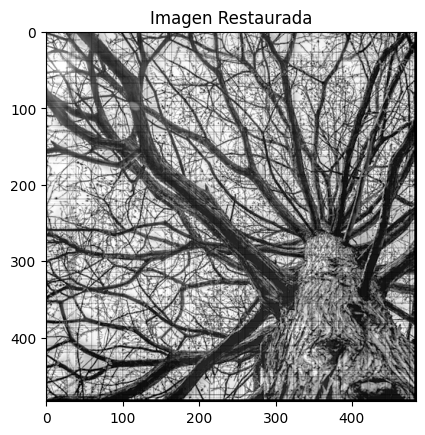

In [11]:
F_rest = restaurar_total(G, H, bloque=38)

plt.imshow(F_rest, cmap='gray')
plt.title('Imagen Restaurada')
plt.show()

B-5) Calcule el error promedio ERR (definición vista en clases).

Error promedio (B-5 corregido y alineado) =  26.044036091256444 %


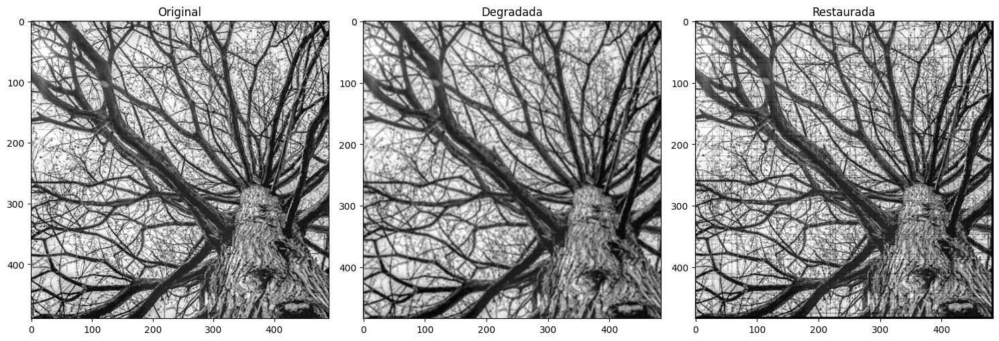

In [12]:
def ERR(F1, F2):
    # Ajustar al mismo tamaño (recorte al mínimo)
    N1, M1 = F1.shape
    N2, M2 = F2.shape
    N = min(N1, N2)
    M = min(M1, M2)

    F1c = F1[0:N, 0:M]
    F2c = F2[0:N, 0:M]

    Q = N * M
    err = np.sum(np.abs(F1c - F2c)) / Q / 255 * 100
    return err

errB = ERR(F, F_rest)
print('Error promedio (B-5 corregido y alineado) = ', errB, '%')

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(F, cmap='gray'); ax[0].set_title('Original')
ax[1].imshow(G, cmap='gray'); ax[1].set_title('Degradada')
ax[2].imshow(F_rest, cmap='gray'); ax[2].set_title('Restaurada')
plt.tight_layout(); plt.show()

La imagen restaurada se ve bastante parecida a la original y se reduce bastante el desenfoque que se veia en la imagen degradada.

# C) Proceso real (lejanía)

Restaurar una imagen que fue tomada de manera desenfocada con dos métodos de restauración distintos (se desea poder leer bien el texto de la foto).

Esta permitido rotar, escalar o hacer una transformacion de perspectiva de la imagen degradada y/o de la imagen sin degradacion  de manera manual antes de aplicar el algoritmo de restauración. Está permitido el uso de funciones de restauración implementadas en librerías Python

In [1]:
import numpy as np
import matplotlib.pylab as plt
from cv2 import imread, IMREAD_GRAYSCALE
from numpy.fft import fft2, ifft2

Primero voy a cargar la imagen degradada  y la original para ver luego si estan funcionando bien las restauraciones.

In [2]:
!wget https://www.dropbox.com/scl/fi/vbigr72m42kqyhmj143cd/image_sharp.png?rlkey=y8s87z2ps66r787wke7d1pny7&e=1

--2025-11-08 15:18:12--  https://www.dropbox.com/scl/fi/vbigr72m42kqyhmj143cd/image_sharp.png?rlkey=y8s87z2ps66r787wke7d1pny7
Resolving www.dropbox.com (www.dropbox.com)... 162.125.80.18, 2620:100:6035:18::a27d:5512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.80.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc2618039fac85472653d3ca7dde.dl.dropboxusercontent.com/cd/0/inline/C0zSM1N2R9BN4RqfobS418RvwMgcCGDo_WKCMI2zghH5ycdZjYa2OT8TObnV9PLIEKPk-zVpEz7nV8tTbCKJyFQWmAZYvtTVFbgdlSrxcCuNbxrvuDFphCO0IR2rGqiGzLA/file# [following]
--2025-11-08 15:18:13--  https://uc2618039fac85472653d3ca7dde.dl.dropboxusercontent.com/cd/0/inline/C0zSM1N2R9BN4RqfobS418RvwMgcCGDo_WKCMI2zghH5ycdZjYa2OT8TObnV9PLIEKPk-zVpEz7nV8tTbCKJyFQWmAZYvtTVFbgdlSrxcCuNbxrvuDFphCO0IR2rGqiGzLA/file
Resolving uc2618039fac85472653d3ca7dde.dl.dropboxusercontent.com (uc2618039fac85472653d3ca7dde.dl.dropboxusercontent.com)... 162.125.85.15, 2620:100:6035:15::a27d:550f
Connecting to

In [3]:
!wget https://www.dropbox.com/scl/fi/a4uooootk5xd6529gbneh/image_blur.png?rlkey=bguietv40ei84gceteqz27dr9&e=1&st=hce8utyt

--2025-11-08 15:18:17--  https://www.dropbox.com/scl/fi/a4uooootk5xd6529gbneh/image_blur.png?rlkey=bguietv40ei84gceteqz27dr9
Resolving www.dropbox.com (www.dropbox.com)... 162.125.80.18, 2620:100:6035:18::a27d:5512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.80.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc0945ce4116cbde85d5ec92b10f.dl.dropboxusercontent.com/cd/0/inline/C0z_yNGSH2R8jPLnhQ4f2xmCwcbF_HZjvlt5AwUrVWgx_AHT_kLQhhVZnrcfvMU7_HAAbU-DE-6CK9RLFz4WqnmIjjPiUZ983esLH2PmfR5N4ClFWZHXMeIkfmp9IVRihSY/file# [following]
--2025-11-08 15:18:17--  https://uc0945ce4116cbde85d5ec92b10f.dl.dropboxusercontent.com/cd/0/inline/C0z_yNGSH2R8jPLnhQ4f2xmCwcbF_HZjvlt5AwUrVWgx_AHT_kLQhhVZnrcfvMU7_HAAbU-DE-6CK9RLFz4WqnmIjjPiUZ983esLH2PmfR5N4ClFWZHXMeIkfmp9IVRihSY/file
Resolving uc0945ce4116cbde85d5ec92b10f.dl.dropboxusercontent.com (uc0945ce4116cbde85d5ec92b10f.dl.dropboxusercontent.com)... 162.125.85.15, 2620:100:6035:15::a27d:550f
Connecting to 

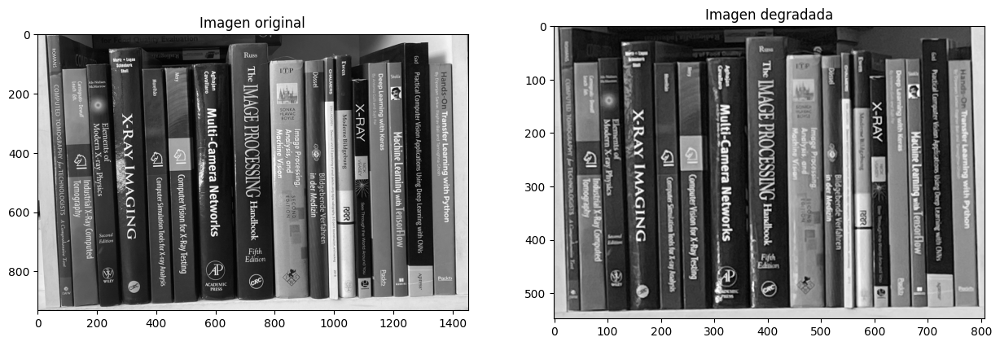

In [7]:
imag_original  = imread('image_sharp.png?rlkey=y8s87z2ps66r787wke7d1pny7.1', IMREAD_GRAYSCALE).astype('double')
imag_degradada = imread('image_blur.png?rlkey=bguietv40ei84gceteqz27dr9.1', IMREAD_GRAYSCALE).astype('double')

plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.imshow(imag_original, cmap='gray')
plt.title("Imagen original")

plt.subplot(1,2,2)
plt.imshow(imag_degradada, cmap='gray')
plt.title("Imagen degradada")
plt.show()

Para el primer metodo voy a recuperar la imagen degradada usando un filtro Wiener

Primero defino 2 funciones, una para tener la mascara Gaussiana h y otra para el ERR la cual es la misma de los ejemplos vistos en clase

In [10]:
# funcion para el Kernel Gaussiano (PSF estimada)
def gaussiankernel(size):
    sigma = size/8.5


    x, y = np.mgrid[-size // 2 + 1:size // 2 + 1,
           -size // 2 + 1:size // 2 + 1]

    kernel = np.exp(-((x ** 2 + y ** 2) / (2.0 * sigma ** 2)))
    kernel = kernel / kernel.sum()
    return kernel.astype('double')

In [11]:
# defino una funcion para calcular el ERR:
# ERR = (1/Q)*Σ|F - F*| * 100/255
def ERR(F,F2):
    r = min(F.shape[0],F2.shape[0])
    c = min(F.shape[1],F2.shape[1])
    Q = r*c
    e = np.sum(np.abs(F[:r,:c]-F2[:r,:c]))/Q/255*100
    return e

Ahora para aplicar la restauracion de la imagen usando el filtro Wiener tenemos que definir una funcion que represente el filtro cuya formulas definidas en clases son:

$$
\hat{F}(u,v) = W(u,v) \, G(u,v)
$$

$$
W = \left[\frac{H^{*}(r)}{|H(r)|^{2}}\right]^{a}
     \left[\frac{H^{*}(r)}{|H(r)|^{2} + \dfrac{C}{\mathrm{SNR}^{2}(r)}}\right]^{1 - a}
$$

In [12]:
# Fórmula usada:
#   F̂(u,v) = W(u,v) G(u,v)
#   W = [H*(r)/|H(r)|²]^a * [H*(r)/( |H(r)|² + C/SNR²(r) )]^(1-a)

def rest_wiener_real(G,h,a=0.5,C=0.02,rho=0.05):
    N,M = G.shape
    n,m = h.shape

    N2 = 2*(N+n-1)    # Se multiplica tamaño para evitar convolución circular
    M2 = 2*(M+m-1)

    Ge = np.zeros((N2,M2))
    Ge[0:N,0:M] = G   # Se inserta G dentro de matriz extendida (padding)

    He = np.zeros((N2,M2))
    He[0:n,0:m] = h   # Se inserta PSF dentro de matriz extendida (padding)

    FG = fft2(Ge)     # Transformada de Fourier de G  → G(u,v)
    FH = fft2(He)     # Transformada de Fourier de h → H(u,v)

    AFH = np.abs(FH)          # |H(u,v)|
    AFH2 = np.multiply(AFH,AFH)   # |H(u,v)|²

    # Definición vista en clase para SNR^{-2}(r) = C * r^ρ
    SNR2inv = np.zeros((N2,M2))
    n2 = N2/2+1
    m2 = M2/2+1
    for i in range(N2):
        for j in range(M2):
            r = np.sqrt((i-n2)**2+(j-m2)**2)
            SNR2inv[i,j] = C*(r**rho)   # Modelo radial visto en pizarra

    # W1 = (H* / |H|²)^a     ← Filtro inverso elevado a a
    W1 = (np.conj(FH)/(AFH2+1e-8))**a

    # W2 = (H* / ( |H|² + C/SNR² ))^(1-a)   ← Corrección Wiener
    W2 = (np.conj(FH)/(AFH2+SNR2inv+1e-8))**(1-a)

    # W = W1 * W2  ← Fórmula completa mostrada en clase
    W  = np.multiply(W1,W2)

    FFs = np.multiply(W,FG)      # F̂(u,v) = W(u,v)*G(u,v)
    Fs_big = np.abs(ifft2(FFs))  # Transformada inversa → dominio espacial

    Ns = N+n-1                   # Tamaño válido de reconstrucción
    Ms = M+m-1
    Fs = Fs_big[0:Ns,0:Ms]
    return Fs

ahora aplico la restauracion con el filtro Wiener

ERR método 1 = 26.347403032088767 %


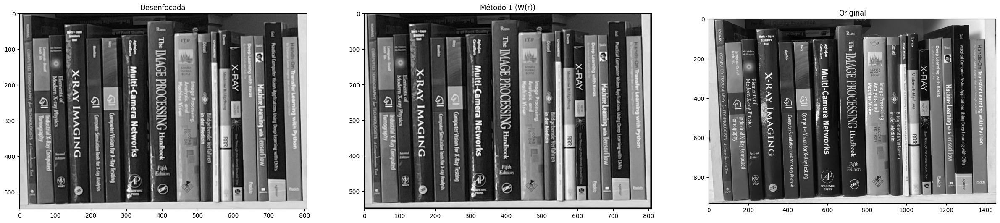

In [13]:
# ESTIMAR PSF (se prueba tamaño manualmente)
hsize = 3
h = gaussiankernel(hsize)
F1 = rest_wiener_real(imag_degradada,h,a=2.0,C=0.02,rho=0.05)

print("ERR método 1 =", ERR(imag_original, F1), "%")

plt.figure(figsize=(30,20))
plt.subplot(131), plt.imshow(imag_degradada, cmap='gray'), plt.title('Desenfocada')
plt.subplot(132), plt.imshow(F1, cmap='gray'),   plt.title('Método 1 (W(r))')
plt.subplot(133), plt.imshow(imag_original, cmap='gray'), plt.title('Original')
plt.show()


Notemos que no se recupera mucho la imagen, entones hay que ir variando los parametros para los parammetros tipicos de la funcion definida para ver con que combinacion hay un menor ERR

In [14]:
hsizes = [9, 15, 21, 25, 31] #valores tipicos
a_vals = [0.0, 0.3, 0.5, 0.7, 1.0]

best_err = 999
best = None

for hsize in hsizes:
    h = gaussiankernel(hsize)
    for a in a_vals:
        Ftest = rest_wiener_real(imag_degradada, h, a=a, C=0.02, rho=0.05)
        err = ERR(imag_original, Ftest)
        print(f"hsize={hsize}, a={a}, ERR={err:.3f}%")

        if err < best_err:
            best_err = err
            best = (hsize, a, Ftest)

print("\n>>> Mejor combinación encontrada:")
print("hsize =", best[0], ", a =", best[1], ", ERR =", best_err, "%")

F_best = best[2]


# Visualización Final Restaurada

r, c = imag_degradada.shape
F_best_adj = F_best[:r, :c]

hsize=9, a=0.0, ERR=26.992%
hsize=9, a=0.3, ERR=27.341%
hsize=9, a=0.5, ERR=27.841%
hsize=9, a=0.7, ERR=29.576%
hsize=9, a=1.0, ERR=137.531%
hsize=15, a=0.0, ERR=29.217%
hsize=15, a=0.3, ERR=30.053%
hsize=15, a=0.5, ERR=31.678%
hsize=15, a=0.7, ERR=51.412%
hsize=15, a=1.0, ERR=2394.983%
hsize=21, a=0.0, ERR=30.612%
hsize=21, a=0.3, ERR=32.120%
hsize=21, a=0.5, ERR=35.762%
hsize=21, a=0.7, ERR=83.121%
hsize=21, a=1.0, ERR=4078.871%
hsize=25, a=0.0, ERR=31.192%
hsize=25, a=0.3, ERR=32.965%
hsize=25, a=0.5, ERR=37.921%
hsize=25, a=0.7, ERR=112.057%
hsize=25, a=1.0, ERR=5905.981%
hsize=31, a=0.0, ERR=32.065%
hsize=31, a=0.3, ERR=33.990%
hsize=31, a=0.5, ERR=40.436%
hsize=31, a=0.7, ERR=155.477%
hsize=31, a=1.0, ERR=8591.096%

>>> Mejor combinación encontrada:
hsize = 9 , a = 0.0 , ERR = 26.9921968727996 %


El parámetro "a" controla la mezcla entre el filtro inverso (a=1) y el filtro inverso corregido (a=0).Cuando a se acerca a 0, la restauración es más estable y no amplifica el ruido, por lo que el ERR es menor.Cuando a se acerca a 1, el filtro intenta invertir completamente la degradación dividiendo por H(ω),
lo que amplifica fuertemente las frecuencias donde H(ω) es pequeño. Esto genera gran rizado, ruido y,
en casos extremos, valores explosivos — el ERR aumenta rápidamente.

Comparando la imagen original con la mejor imagen restaurada (con menor ERR) tenemos:

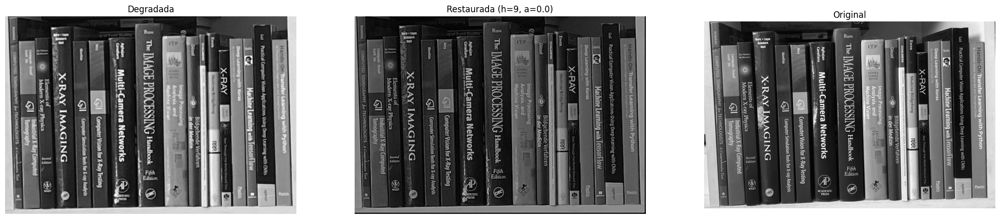

In [15]:
plt.figure(figsize=(25,15))
plt.subplot(1,3,1), plt.imshow(imag_degradada, cmap='gray'), plt.title("Degradada"), plt.axis('off')
plt.subplot(1,3,2), plt.imshow(F_best_adj, cmap='gray'), plt.title(f"Restaurada (h={best[0]}, a={best[1]})"), plt.axis('off')
plt.subplot(1,3,3), plt.imshow(imag_original, cmap='gray'), plt.title("Original"), plt.axis('off')
plt.show()

las letras se llegan a leer mejor pero no es perfecta la restauracion (podemos notarlo tambien con los ERR obtenidos que no son tan bajos como quisieramos)

Finalmente quiero ver las imagenes en colores RGB para ver las diferencias entre la original, degradada y la recuperada con el filtro Wiener

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Volver a cargar la degradada y original en color (por si estaban alteradas antes)
blur_color  = cv2.imread('image_blur.png?rlkey=bguietv40ei84gceteqz27dr9.1')
orig_color  = cv2.imread('image_sharp.png?rlkey=y8s87z2ps66r787wke7d1pny7.1')
blur_color  = cv2.cvtColor(blur_color, cv2.COLOR_BGR2RGB)
orig_color  = cv2.cvtColor(orig_color, cv2.COLOR_BGR2RGB)

# Asegurar tamaño de F_best
r, c = blur_color.shape[:2]
F_best_adj = F_best[:r, :c]

# Se ajusta la luminancia restaurada a 0..255 de manera proporcional
F_norm = F_best_adj - F_best_adj.min()
F_norm = F_norm / F_norm.max()
F_norm = (F_norm * 255).astype('uint8')

# Convertir degradada a YCbCr
blur_ycbcr = cv2.cvtColor(blur_color, cv2.COLOR_RGB2YCrCb)

# Reemplazar solo el canal Y con la versión normalizada
blur_ycbcr[:,:,0] = F_norm

# Convertir de nuevo a RGB
F_best_color = cv2.cvtColor(blur_ycbcr, cv2.COLOR_YCrCb2RGB)

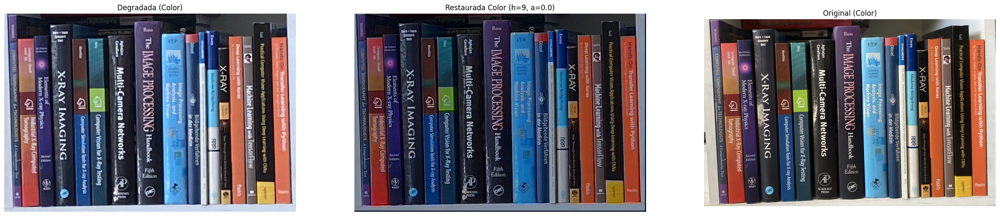

In [18]:
plt.figure(figsize=(30,20))

plt.subplot(1,3,1)
plt.imshow(blur_color)
plt.title("Degradada (Color)")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(F_best_color)
plt.title(f"Restaurada Color (h={best[0]}, a={best[1]})")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(orig_color)
plt.title("Original (Color)")
plt.axis('off')

plt.show()

Efectivamente se leen mejor las letras en la imagen pero no es tan perfecto como la original aunque si es mucho mas leible que la imagen desenfocada.